# User Manual

This is an example of using the tools developed for the Thin Section Analysis project in the intended workflow.


## Download Code
If not already present this clones the repo into google colab. If all packages are already locally present this is not needed.

In [2]:
from getpass import getpass
import os

!git config --global user.name "Richard Boyne"
!git config --global user.email "boynerichard@yahoo.co.uk"

# if not in a repo clone the desired one
if not os.path.isdir(".git"):
    
    # get username and password
    user = "Boyne272"
    password = getpass('github password')
    os.environ['GITHUB_AUTH'] = user + ':' + password
    
    # clone the repo
    !git clone --quiet https://$GITHUB_AUTH@github.com/msc-acse/acse-9-independent-research-project-Boyne272.git repo

    # move the repo directory up one
    !mv repo/.git .
    
    # swap to the wanted branch
#     !git checkout master --quiet
    !git checkout post_processing --quiet

    
    # move to previous commit
    !git reset --quiet --hard
    
# remove the sample data if there
if os.path.isdir("sample_data"):
    !rm -r sample_data/

# remove the tmp repo folder if there
if os.path.isdir("repo"):    
    !rm -r repo
    
# show where we are
!git show --summary

github password··········
commit 6f881be97474c6e86b1753964a084391b8edf009 (HEAD -> master, origin/master, origin/HEAD)
Merge: 59dda18 6b8847d
Author: Richard Boyne <31725818+Boyne272@users.noreply.github.com>
Date:   Wed Aug 21 10:21:43 2019 +0100

    Merge pull request #5 from msc-acse/post_processing
    
    Post processing



## Run Tests
Short example of running all module tests

In [96]:
!pytest # last run 21st Aug

============================= test session starts ==============================
platform linux2 -- Python 2.7.15+, pytest-3.6.4, py-1.8.0, pluggy-0.7.1
rootdir: /content, inifile:
collected 24 items                                                             

kmeans/test_MSLIC.py ...                                                 [ 12%]
kmeans/test_SLIC.py .....                                                [ 33%]
merging/test_AGNES.py ...                                                [ 45%]
merging/test_Segments.py ........                                        [ 79%]
pre_post_processing/test_Image_processor.py ....                         [ 95%]
pre_post_processing/test_Segment_Analyser.py .                           [100%]

========================== 24 passed in 81.07 seconds ==========================


## Imports

In [0]:
# Ipython magic functions
%load_ext autoreload
%autoreload 2
%matplotlib inline

# path extensions to find local modules
import sys
sys.path.insert(0, "/content/kmeans")
sys.path.insert(0, "/content/merging")
sys.path.insert(0, "/content/pre_post_processing")

In [0]:
# imports
import torch
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd 

# custom imports
from AGNES import AGNES
from Image_processor import Image_processor
from Segment_Analyser import Segment_Analyser
from Segments import segment_group
from SLIC import SLIC
from MSLIC import MSLIC_wrapper

# Butterfly Segmentation Example

First we need to load the image, Image processor is a module to assist with loading an image and apply any kind of filters initially wanted.

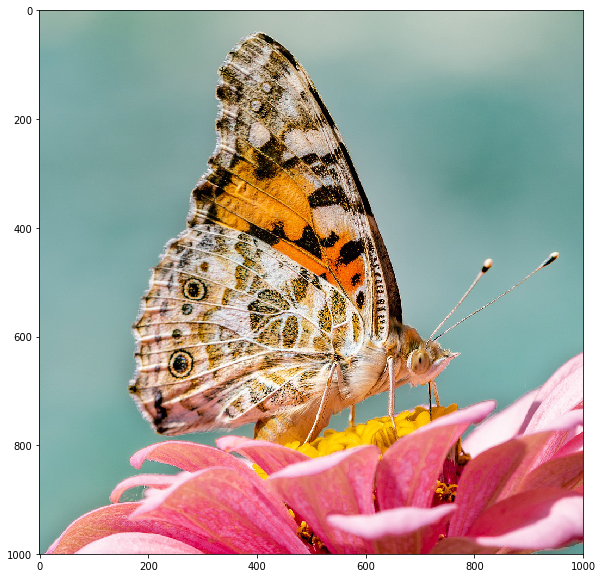

In [71]:
butterfly_IP = Image_processor(path='/content/images/butterfly.tif')
butterfly_IP.plot()

## Segmentation
For the SLIC segmentation it help reduce disjointed segments if we first clur the image slightly, this quite easy to do with Image_processor.

In [0]:
blured_img = butterfly_IP.gauss(sigma=3)

Now we can look at what SLIC manages to do with this.

Progress |###################################################| 84.5368 s

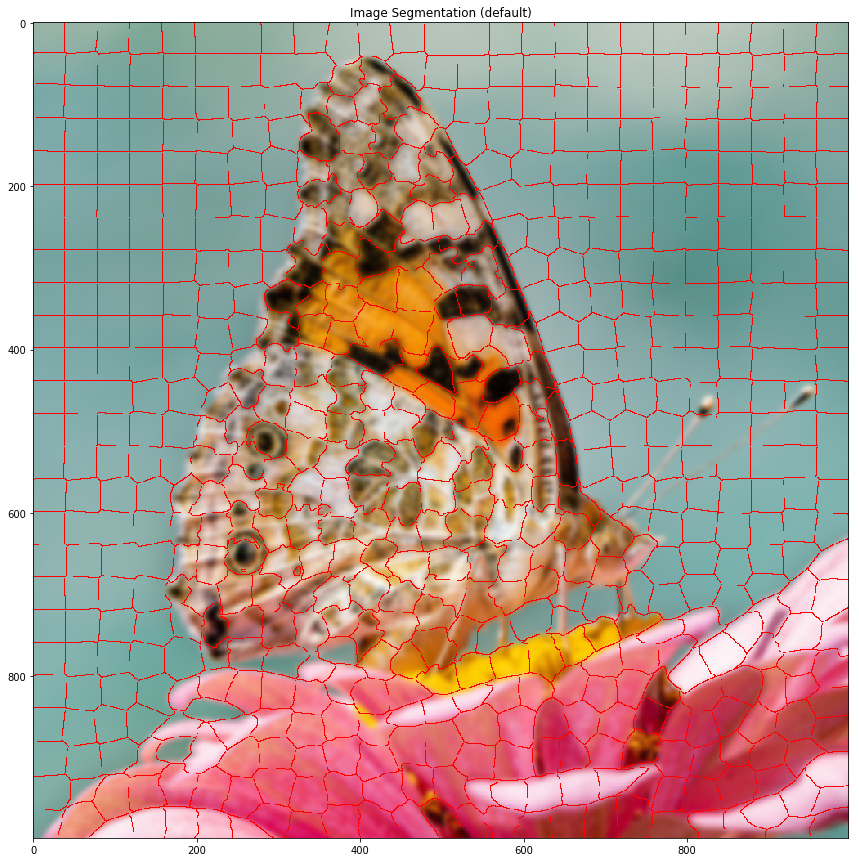

In [73]:
# create the SLIC object iterate it and plot
butterfly_SLIC = SLIC(blured_img, bin_grid=[25, 25])
butterfly_SLIC.iterate(10)
butterfly_SLIC.plot()

## Segment Clustering
To extract features of each segment for clustering we need to create a segment_group obj. This will need the mask from the SLUC implenetation. When initialising disjoineted segments will be split, hence there will be more segments than in the above image.

641
Initalising 641 segments
Progress |###################################################| 53.6985 s



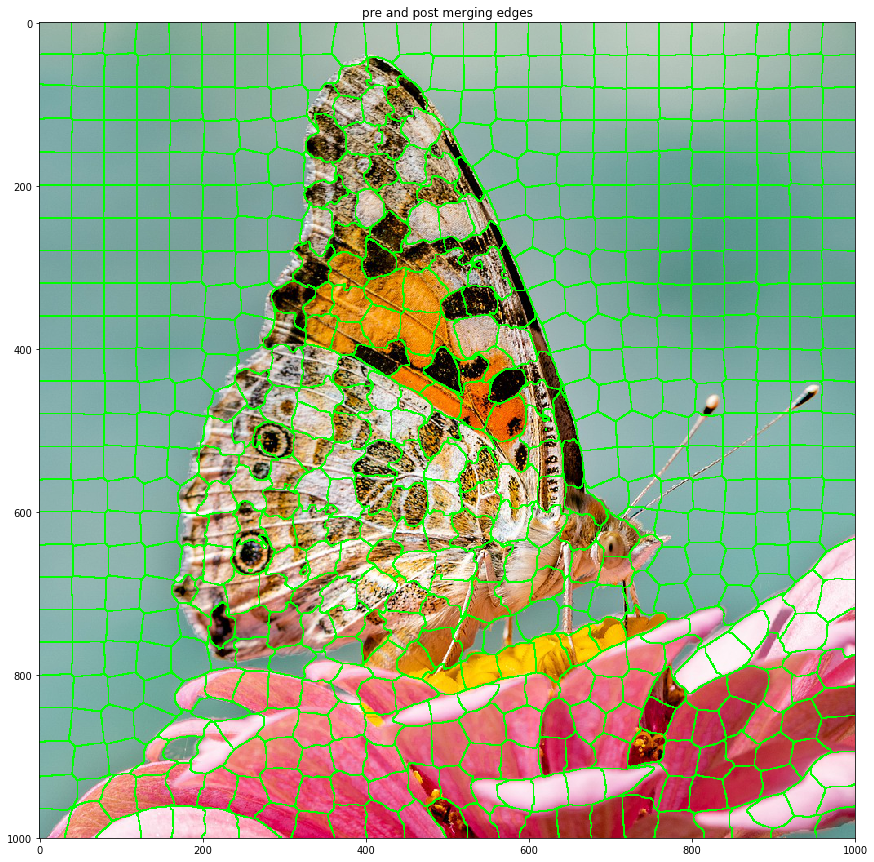

In [74]:
# extract mask
butterfly_mask = butterfly_SLIC.get_segmentation()

# create segment groups, enforce size and plot
butterfly_segs = segment_group(butterfly_mask)

# plot the segments
original_img = butterfly_IP.imgs['original']
butterfly_segs.plot(back_img=original_img)

This splitting makes several very small segments. We can force these to merge with there largest neighbour with segment_group.

In [75]:
butterfly_segs.enforce_size(min_size=50)

13 segments merged
Initalising 65 segments
Progress |###################################################| 5.6965 s



Notice how only 65 segments were recreated; since those with unchanging neighbours dont need any recaculations they are kept the same.

Now we can extract features from each segment, to do an extraction function is needed.

In [76]:
# define the features to be extracted
def basic_color_extraction(Xs, Ys, img1):
    avgs1 = img1[Ys, Xs].mean(axis=0)
    return [*avgs1]

# extract features
butterfly_feats = butterfly_segs.feature_extraction(
                      extract_func = basic_color_extraction,
                      func_vars = [blured_img])

# inspect features
titles = ['red_avg', 'green_avg', 'blue_avg']
pd.DataFrame(butterfly_feats, columns=titles).describe()

,red_avg,green_avg,blue_avg
count,628.000000,628.000000,628.000000
mean,0.633492,0.590180,0.548509
std,0.178521,0.161467,0.188331
min,0.139023,0.050462,0.034291
25%,0.495582,0.529275,0.465894
50%,0.584799,0.646804,0.618828
75%,0.780434,0.693747,0.668248
max,0.986018,0.911795,0.935627


We have used a pandas dataframe to inspect the extracted features. They seem good, with means and standard deviations of similar magnitude. We can now use our chosen unspuervised clustering algorithm to group segments by common features. Here we are using the AGNES clustering

Progress |###################################################| 0.3791 s



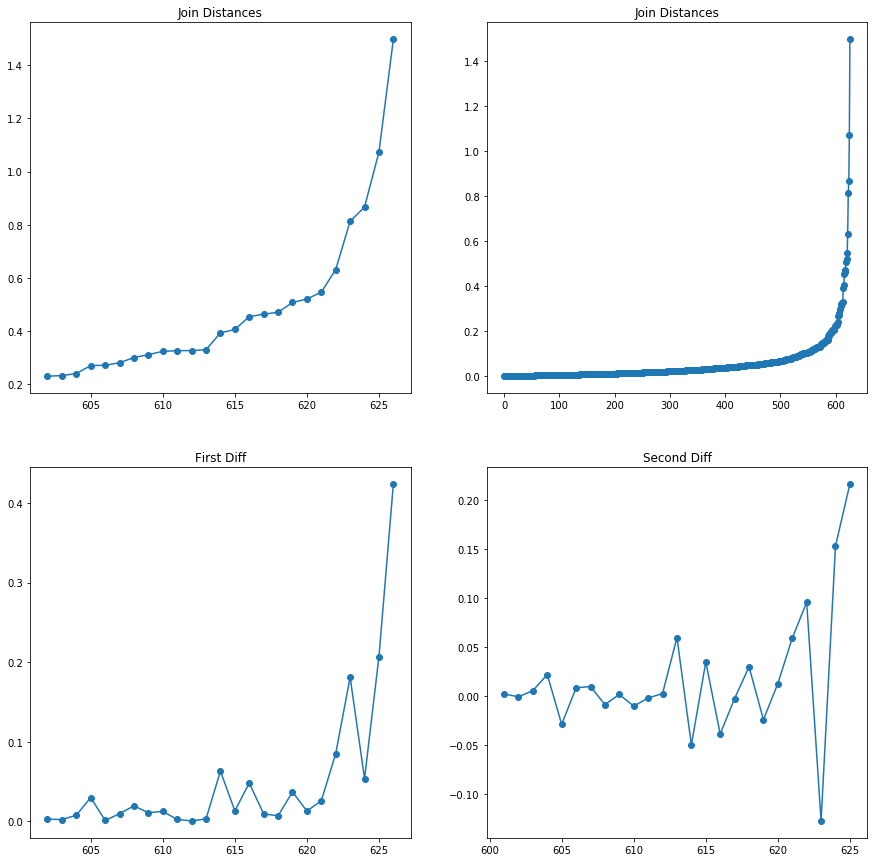

In [77]:
butterly_AGNES = AGNES(butterfly_feats)
butterly_AGNES.iterate()
butterly_AGNES.cluster_distance_plot('all')

Plotted above is merge distance vs iterations and its respective derivatives on the last few iterations. In the second derivative there is a spike arounf iteration 610, suggesting that this is where we start merging different material groups. To get this point we cluster up to a certain viaration in standard deviation, here chosen to be 3.

In [78]:
# get the clustering up to 3rd standard deviation
butterly_clusters = butterly_AGNES.cluster_by_derivative(n_std=3., plot=False)

Clustering up to 2nd derivative 0.04021483184552015
Clustering into 14 segments


By passing this clustering to the segment_group we can plot what segments were cluster together.

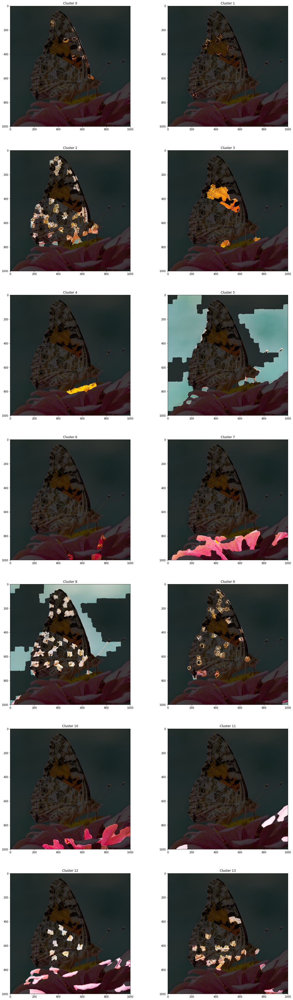

In [79]:
# assign these cluster in the segment groups
butterfly_segs.assign_clusters(butterly_clusters)

# plot these clusters
butterfly_segs.plot('cluster_all', back_img = original_img)

Though only color was used the clusters are mostly reasonable, thoough a few regions of wing are confused with sky. If we are happy with these clusters we can merge with them, if not we can do another featuer extraction and clustering without needing to reinitalise the segment_group object.

## Edge analysis (if wanted)

If we want to an edge detection can be done to assist the later merging so that only segments with no edge between them are merged. This is not needed to do the mergering, and so this section can be skipped.

First we need an image with edges detected in it.

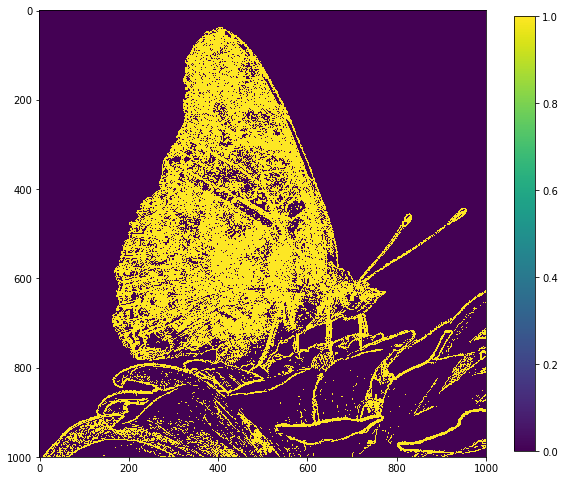

In [80]:
butterfly_IP.reset()
butterfly_IP.scharr()
butterfly_IP.grey_scale()
binary_edges = butterfly_IP.threshold(value=.05)
butterfly_IP.plot()

Now by defining an edge confidence function with this image (similar to the feature extraction function before) we can assign this to the segment_group object.

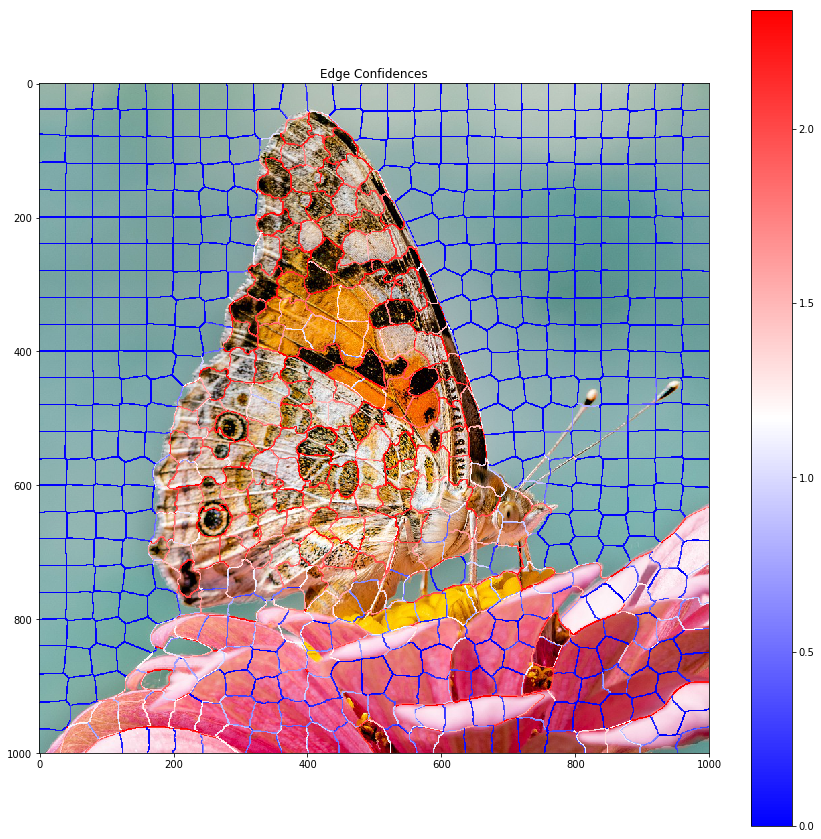

In [81]:
# define extraction function
def edge_extraction(Xs, Ys, scharr_img):
    return scharr_img[Ys, Xs].mean() / scharr_img.std()

# pass this to the group object and plot it
butterfly_segs.edge_confidence(confidence_func = edge_extraction,
                               func_vars = [binary_edges])
butterfly_segs.plot('edge_conf', back_img = original_img)

So as we can see some edges are confident that they exist and others are less so. Since these have been assigned to the segment_group they will automatically be considered in the merging stage (the threshold for an edge being present can be set if want)

## Segment Merging
Now the segment_group knows the clustering (and edge confidences) we can instruct it to merge segments that are adjasent, in the same cluster (and have a edge confidence below the given threshold). Note we could also merge without clusters and just edge confidence instead.

412 segments merged
Initalising 113 segments
Progress |###################################################| 9.8255 s



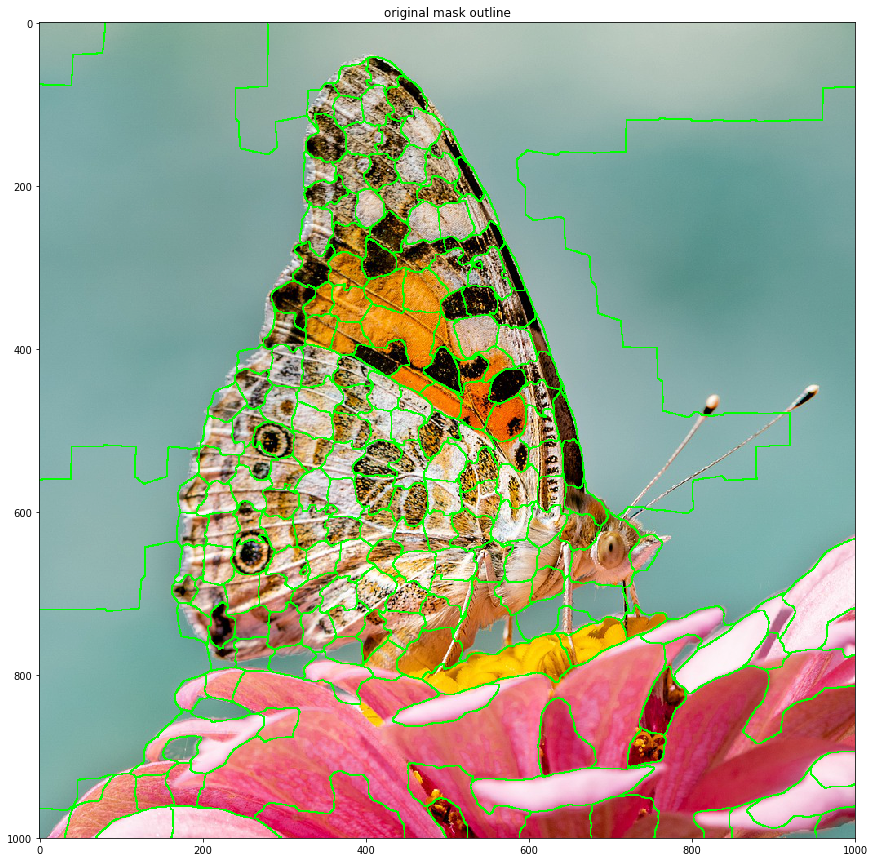

In [82]:
# merge using clustering and edge confidence (if given)
butterfly_segs.merge_by_cluster(edge_present=1.)

# # merge if there is a low edge confidence only
# butterfly_segs.merge_by_edge(edge_absent=.1) 

# plot the resultant clustering
butterfly_segs.plot('merged_edges', back_img=butterfly_IP.imgs['original'])

## Repeat (if wanted)
At this point the process of clustering, edge detection and merging could be repeated if wanted.

Caution is needed when clustering as there are less samples in the clustering routene so it may struggle. Another point of caution is that if one experiments with different clustering here it will affect the clusters used in the segment analysis section.

This second repeat is done here as it is not benificial for this image.

In [0]:
# # feature extraction
# butterfly_feats = butterfly_segs.feature_extraction(
#                       extract_func = basic_color_extraction,
#                       func_vars = [blured_img])

# # clustering
# butterly_AGNES = AGNES(butterfly_feats)
# butterly_AGNES.iterate()

# # get the clustering and assign it
# butterly_clusters = butterly_AGNES.cluster_by_derivative(n_std=2., plot=False)
# butterfly_segs.assign_clusters(butterly_clusters)

# # plot these clusters
# butterfly_segs.plot('cluster_all', back_img=original_img)

In [0]:
# # implement cluster merging (no edge detection used this time)
# butterfly_segs.merge_by_cluster()
# butterfly_segs.plot('both', back_img=original_img)

## Segmentation Analysis
Now we have our segmented image we can analyse the distributions within each cluster.

First we need to create the Segment_Analysis obj with the segmentation mask and clustering mask.

In [0]:
# extract the cluster mask
butterfly_cluster = butterfly_segs.get_cluster_mask()

# extract the segments mask
butterfly_mask = butterfly_segs.mask

# create the segment analyser obj
butterfly_SA = Segment_Analyser(img = original_img,
                                mask = butterfly_mask,
                                clusters=butterfly_cluster)

We can then label each cluster as something more appropirate for the analysis. If we think two clusters are actually part of the same material we give them both the same label and the clusters are grouped. Here we will just label with sky, wing or flower for simplicity.

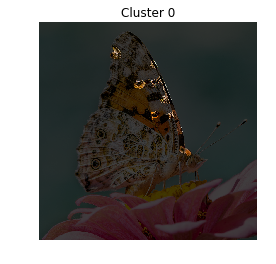

Currently labelled  0 
Give a new label (leave blank to unchange):
wing


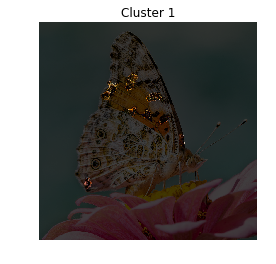

Currently labelled  1 
Give a new label (leave blank to unchange):
wing


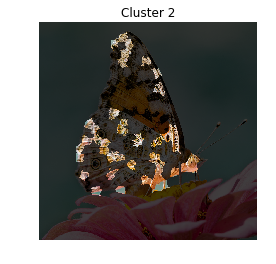

Currently labelled  2 
Give a new label (leave blank to unchange):
wing


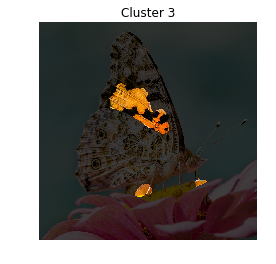

Currently labelled  3 
Give a new label (leave blank to unchange):
wing


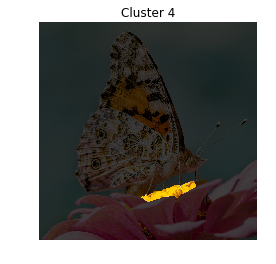

Currently labelled  4 
Give a new label (leave blank to unchange):
flower


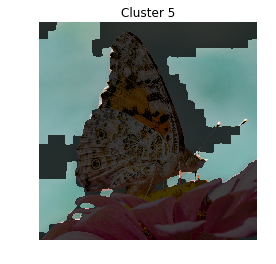

Currently labelled  5 
Give a new label (leave blank to unchange):
sky


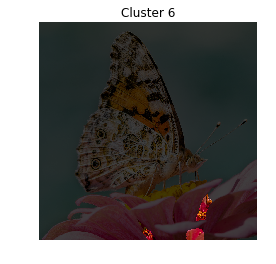

Currently labelled  6 
Give a new label (leave blank to unchange):
flower


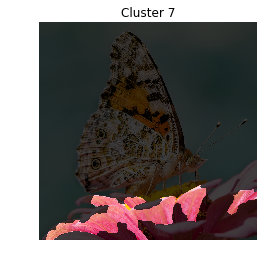

Currently labelled  7 
Give a new label (leave blank to unchange):
flower


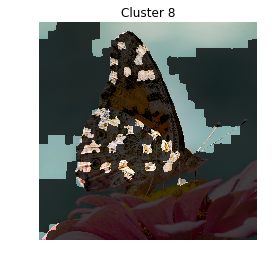

Currently labelled  8 
Give a new label (leave blank to unchange):
sky


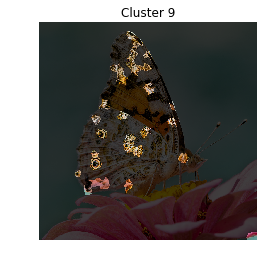

Currently labelled  9 
Give a new label (leave blank to unchange):
wing


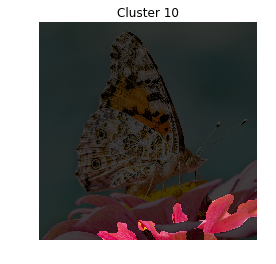

Currently labelled  10 
Give a new label (leave blank to unchange):
flower


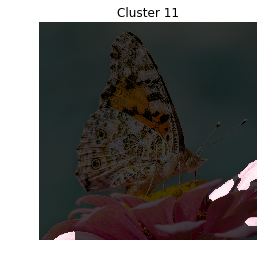

Currently labelled  11 
Give a new label (leave blank to unchange):
flower


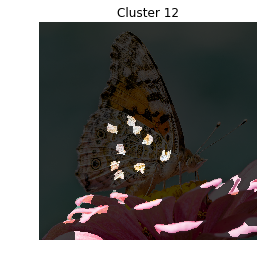

Currently labelled  12 
Give a new label (leave blank to unchange):
flower


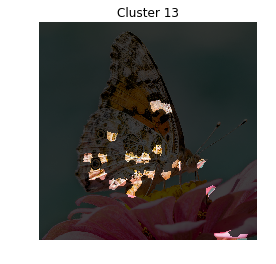

Currently labelled  13 
Give a new label (leave blank to unchange):
wing
Current Labels: ['wing', 'flower', 'sky']


In [88]:
butterfly_SA.set_labels()

Since the clusters are now labeled we can look at the overall (final) segmentation. 

Note the following plot function chooses colors randomly so you might need to run a few times to get a clear image.

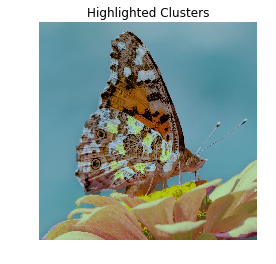

In [93]:
butterfly_SA.plot_clusters()

As can be seen there is some confusion between bits of wing 
and the other two regions, other than that the segementation seems ok.

We can see the distributions of each cluster as well. 

Tabel of Compositions
20.56 %	 wing
21.87 %	 flower
57.57 %	 sky
Tabel of Grain Count
130 	 wing
42 	 flower
44 	 sky


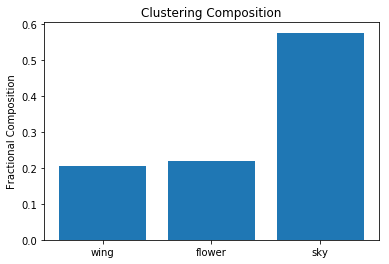

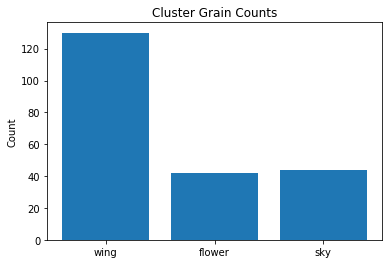

In [94]:
butterfly_SA.get_composition()
butterfly_SA.get_grain_count()

Progress |###################################################| 3.2276 s

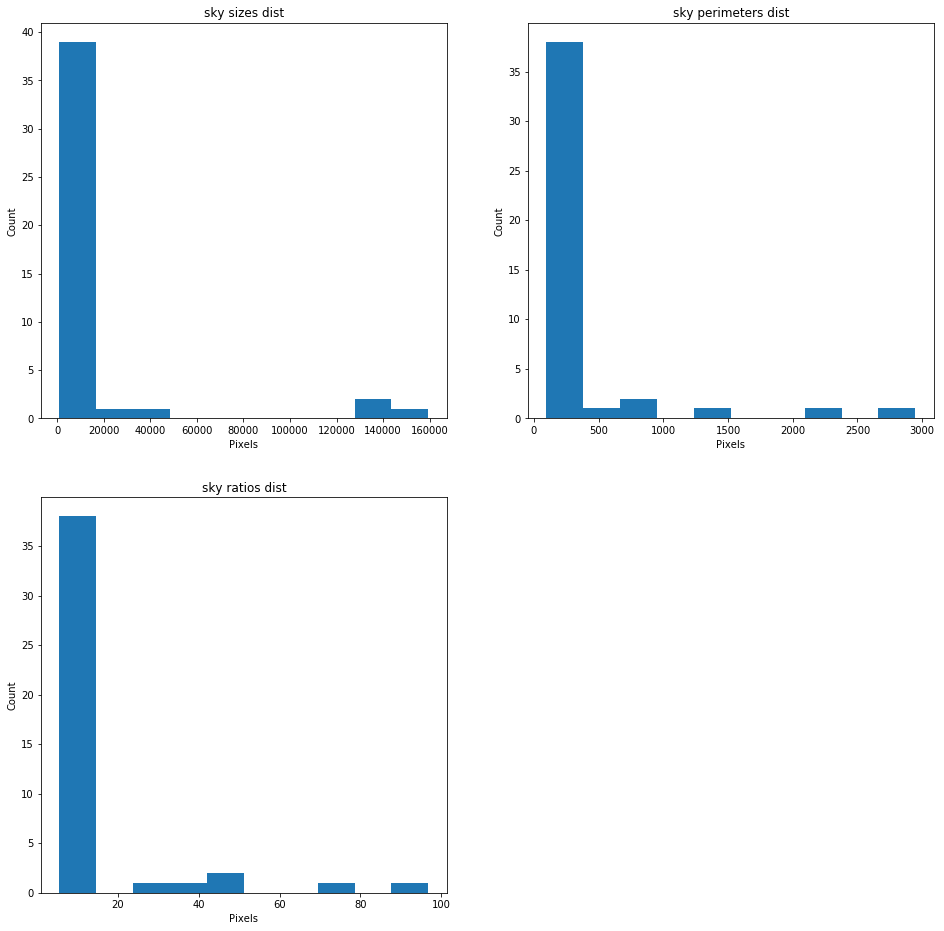

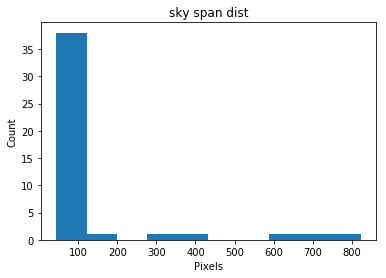

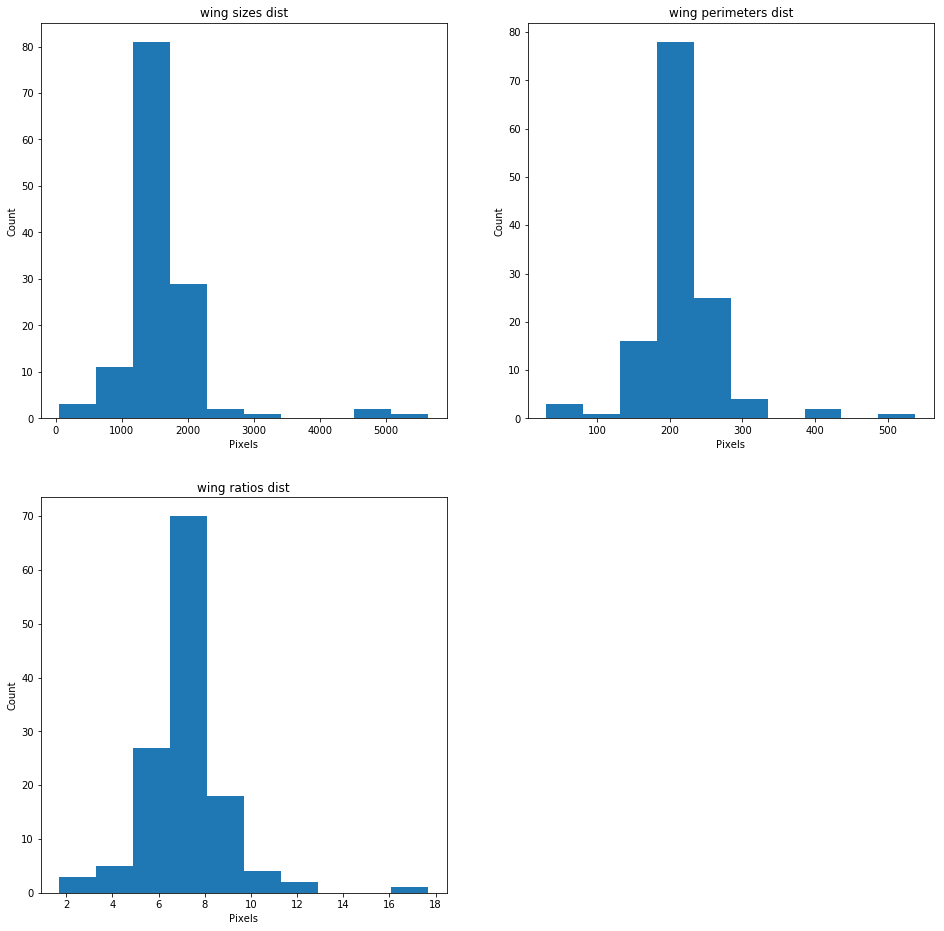

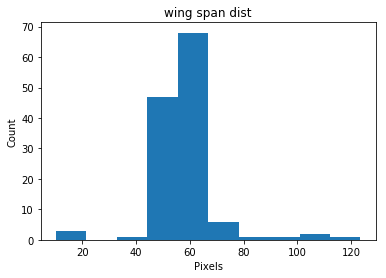

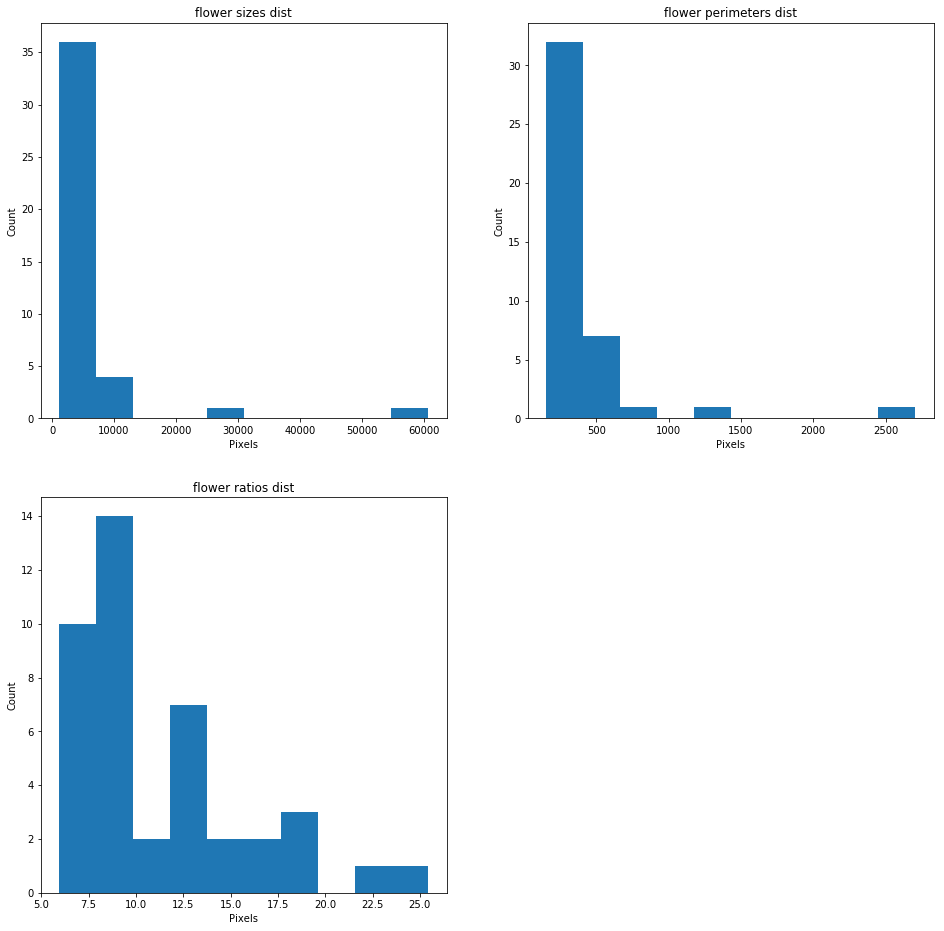

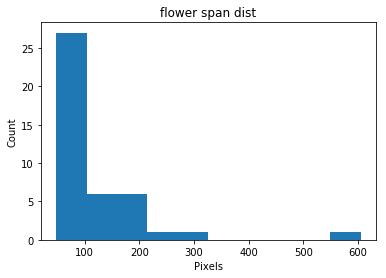

In [95]:
# these take slighly longer to find
for label in ['sky', 'wing', 'flower']:
    butterfly_SA.get_gsd(label)
    butterfly_SA.get_span(label)

If any of the results want to be further analysed than an option return_arr in the above functions get the specific values plotted above.

To save results all that needed is to save the segmentation mask and cluster mask. These can likewise be used to pick up from any point in the routene shown here.

For further information refer to the docstrings at _________.

# _
created by Richard Boyne (rmb115@ic.ac.uk) on 29th August 2019